Azad Rasul: azad.rasul@soran.edu.iq. 
Attribution: The code was inspired by the DroneMapper CropAnalysis project:
https://github.com/dronemapper-io/CropAnalysis

#### Project Data Description
This tutorial analyzes crop data using Digital Elevation Models (DEM), Digital Terrain Models (DTM), and multi-spectral imagery from a MicaSense Altum sensor, processed with DroneMapper Remote Expert.

##### Data Download
Download the GeoTIFF data from: DroneMapper Crop Analysis Data (https://github.com/dronemapper-io/CropAnalysis) and extract it into the data/ directory of your notebook.

Included Files:

##### DEM Data

File: data/DrnMppr-DEM-AOI.tif
Description: 32-bit DEM providing terrain elevation.

##### Orthomosaic Data

File: data/DrnMppr-ORT-AOI.tif

Description: 16-bit imagery with bands for Red, Green, Blue, NIR, RedEdge, and Thermal.

##### DTM Data

File: data/DrnMppr-DTM-AOI.tif
Description: 32-bit DTM representing the bare earth surface.

##### Shapefiles

Plant Count AOI: data/plant_count.shp

Plot 1 AOI: data/plots_1.shp

Plot 2 AOI: data/plots_2.shp

Note: Ensure the files are correctly placed in the data/ directory for analysis.

### Importing necessary libraries for geospatial analysis and visualization

In [1]:
# Importing necessary libraries for geospatial analysis and visualization
import numpy as np  # For numerical operations on arrays
import rasterio  # For reading and writing raster data
import matplotlib.pyplot as plt  # For plotting and visualizing data
import earthpy as et  # Earthpy for handling geospatial data
import earthpy.plot as ep  # Plotting functions in Earthpy
import earthpy.spatial as es  # Spatial functions in Earthpy
import geopandas as gpd  # For handling vector data (shapefiles)
from rasterio.plot import plotting_extent  # For getting the extent of raster data for plotting
import rasterstats as rs  # For calculating zonal statistics
from shapely.geometry import Polygon  # For geometric operations
import pandas as pd  # For handling data in DataFrames
import cv2  # OpenCV for image processing (though not used in this script)


### Data Loading and Preprocessing

In [2]:
def load_raster_data(file_path):
    """
    Load raster data from a file and return the data array and transform information.
    The transform is used to convert pixel coordinates to geographic coordinates.

    Parameters:
    - file_path: Path to the raster file.

    Returns:
    - data: Numpy array containing the raster data.
    - transform: Affine transformation for the raster data.
    """
    with rasterio.open(file_path) as src:
        # Read all bands of the raster data into a Numpy array
        data = src.read()
        # Get the affine transformation to convert pixel to geographic coordinates
        transform = src.transform
    return data, transform

# File paths for DEM and orthomosaic data
# DEM file contains elevation data for the area of interest
dem_path = 'data/dem.tif'
# Orthomosaic file contains high-resolution imagery with multiple bands
ortho_path = 'data/ortho.tif'

# Load DEM (Digital Elevation Model) data
# dem_data contains elevation information
# dem_transform provides the spatial reference for the DEM
dem_data, dem_transform = load_raster_data(dem_path)

# Load orthomosaic data
# ortho_data contains multi-band imagery, including RGB and RedEdge bands
ortho_data, _ = load_raster_data(ortho_path)

# Process the elevation data
# Use the first band of the DEM, which typically contains elevation values
elevation_data = dem_data[0]

# Set all non-positive elevation values (e.g., 0 or negative) to NaN
# This is useful for masking out invalid or water areas in the elevation data
elevation_data[elevation_data <= 0] = np.nan

# Process the RedEdge band from the orthomosaic data
# Use the fifth band (index 4) which is typically the RedEdge band
# Mask out all non-positive values to avoid including invalid data in analysis
rededge_masked = np.ma.masked_where(ortho_data[4] <= 0, ortho_data[4])

# Generate a hillshade effect to visualize the terrain relief
# Hillshade is a 3D representation of the terrain created by simulating sunlight
# azimuth sets the direction of the light source (in degrees)
# altitude sets the angle of the light source above the horizon
hillshade_effect = es.hillshade(elevation_data, azimuth=210, altitude=30)

# The hillshade effect enhances the perception of depth and terrain features
# Useful for visual analysis and presentation of geographic data

### Visualization of Orthomosaic and Elevation Data

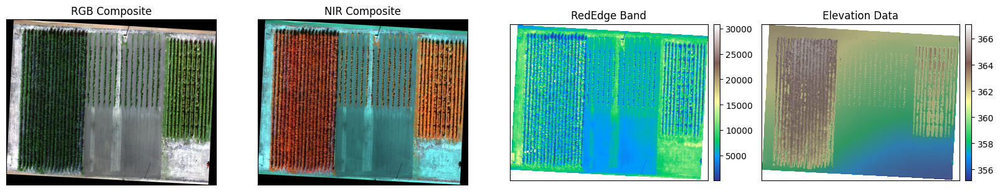

In [3]:
def plot_rgb_composites(ortho_data, rededge_masked, elevation_data, hillshade_effect):
    """
    Create subplots to display various composites of the orthomosaic and elevation data.

    Parameters:
    - ortho_data: Numpy array of the orthomosaic data.
    - rededge_masked: Masked array of the RedEdge band.
    - elevation_data: Numpy array of the elevation data.
    - hillshade_effect: Numpy array of the hillshade effect.
    """
    fig, axes = plt.subplots(1, 4, figsize=(20, 20))
    # Plot RGB composite
    ep.plot_rgb(ortho_data, ax=axes[0], rgb=[0, 1, 2], title="RGB Composite", stretch=True)
    # Plot NIR (Near-Infrared) composite
    ep.plot_rgb(ortho_data, ax=axes[1], rgb=[3, 1, 2], title="NIR Composite", stretch=True)
    # Plot RedEdge band
    ep.plot_bands(rededge_masked, ax=axes[2], scale=False, cmap="terrain", title="RedEdge Band")
    # Plot elevation data with hillshade overlay
    ep.plot_bands(elevation_data, ax=axes[3], scale=False, cmap="terrain", title="Elevation Data")
    axes[3].imshow(hillshade_effect, cmap="Greys", alpha=0.5)
    plt.show()

# Plot the RGB composites
plot_rgb_composites(ortho_data, rededge_masked, elevation_data, hillshade_effect)

### Function Definitions for Zonal Statistics Computation and Visualization

In [4]:
def compute_zonal_stats(aoi, data, transform, stats_list):
    """
    Compute zonal statistics for a given area of interest (AOI) and raster data.

    Parameters:
    - aoi: Geopandas GeoDataFrame of the area of interest.
    - data: Numpy array of the raster data.
    - transform: Affine transformation for the raster data.
    - stats_list: List of statistics to compute (e.g., "count min mean max median std").

    Returns:
    - List of zonal statistics in GeoJSON format.
    """
    return rs.zonal_stats(aoi, data, nodata=0, affine=transform, geojson_out=True, 
                          copy_properties=True, stats=stats_list)

def plot_zonal_statistics(data, stats_df, title, cmap, stats_col, plot_extent):
    """
    Plot raster data with zonal statistics overlay.

    Parameters:
    - data: Numpy array of the raster data.
    - stats_df: Geopandas GeoDataFrame containing the zonal statistics.
    - title: Title for the plot.
    - cmap: Colormap to use for the raster data.
    - stats_col: Column name of the statistic to plot.
    - plot_extent: Plotting extent for the raster data.
    """
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.imshow(data, cmap=cmap, vmin=np.nanmin(data), vmax=np.nanmax(data), extent=plot_extent)
    ax.set_title(title)
    stats_df.plot(stats_col, ax=ax, cmap=cmap, edgecolor='black', linewidth=1, alpha=0.5)
    # Annotate statistics on the plot
    for _, row in stats_df.iterrows():
        if stats_col in row and row.geometry.centroid is not None:
            ax.annotate(text='{:.2f}'.format(row[stats_col]), xy=row.geometry.centroid.coords[0], ha='center', fontsize=10)
    plt.show()


### NDVI Calculation and Visualization

C:\Users\gardi\miniconda3\lib\site-packages\earthpy\spatial.py:105: RuntimeWarning: invalid value encountered in divide
  n_diff = (b1 - b2) / (b1 + b2)


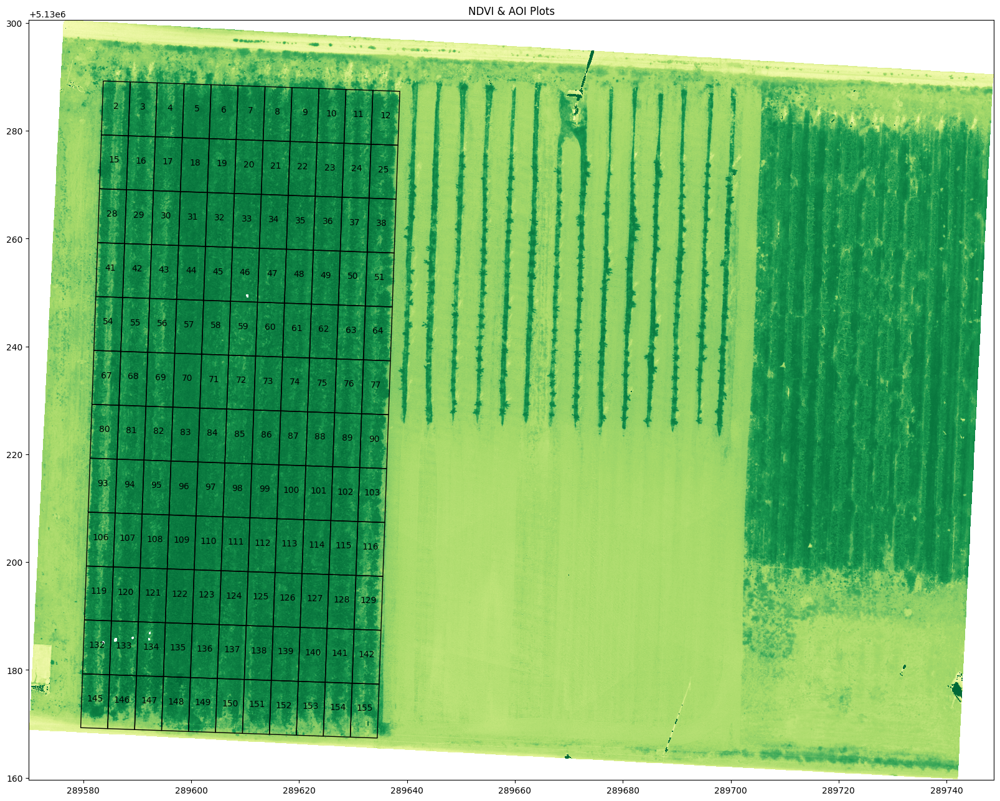

In [5]:
def calculate_ndvi(ortho_data):
    """
    Calculate the Normalized Difference Vegetation Index (NDVI) from orthomosaic data.
    NDVI is a measure of vegetation health and density based on the difference 
    between near-infrared (NIR) and red light reflectance.

    Parameters:
    - ortho_data: Numpy array of the orthomosaic data. The array should contain
      multiple spectral bands, including NIR and red bands.

    Returns:
    - NDVI index as a numpy array. The values range from -1 to 1, where higher values
      indicate healthier, denser vegetation.
    """
    # Calculate NDVI using the formula: (NIR - Red) / (NIR + Red)
    # ortho_data[3] corresponds to the NIR band, and ortho_data[0] to the Red band
    return es.normalized_diff(ortho_data[3], ortho_data[0])

def plot_ndvi(ndvi_index, plots_aoi, dem_transform):
    """
    Plot the NDVI index and overlay AOI plots with annotations for better visualization
    and analysis of vegetation patterns.

    Parameters:
    - ndvi_index: Numpy array of the NDVI index, representing vegetation health.
    - plots_aoi: Geopandas GeoDataFrame containing the areas of interest (AOI) for analysis,
      typically representing plot boundaries or regions of interest.
    - dem_transform: Affine transformation for the DEM data, used to accurately place the
      NDVI data within geographic space.

    This function creates a plot displaying the NDVI values using a color map that highlights
    healthy vegetation (green) and stressed or non-vegetated areas (red). The AOI boundaries
    are overlaid to provide context for the analysis.

    - 'RdYlGn' colormap is used for NDVI: red for low, yellow for medium, green for high NDVI values.
    """
    fig, ax = plt.subplots(figsize=(20, 20))
    # Determine the plotting extent based on the DEM's affine transformation
    plot_extent = plotting_extent(dem_data[0], dem_transform)
    # Display NDVI index as an image with appropriate color map and value range
    ax.imshow(ndvi_index, cmap="RdYlGn", vmin=-1, vmax=1, extent=plot_extent)
    ax.set_title("NDVI & AOI Plots")
    # Overlay the AOI plots on the NDVI image
    plots_aoi.plot(ax=ax, color='None', edgecolor='black', linewidth=1)
    # Annotate each plot with its name at its centroid position
    for _, row in plots_aoi.iterrows():
        if 'NAME' in row and row.geometry.centroid is not None:
            ax.annotate(text=row.NAME, xy=row.geometry.centroid.coords[0], ha='center', fontsize=10)
    plt.show()

# Load AOI shapefile to define areas for analysis
# The shapefile contains geometric boundaries for plots or regions of interest
plots_aoi = gpd.read_file('data/plots_1.shp')

# Calculate NDVI index using the orthomosaic data
ndvi_index = calculate_ndvi(ortho_data)

# Plot the NDVI index with AOI plots overlaid for spatial analysis
plot_ndvi(ndvi_index, plots_aoi, dem_transform)

### Zonal Statistics Computation and Visualization for NDVI

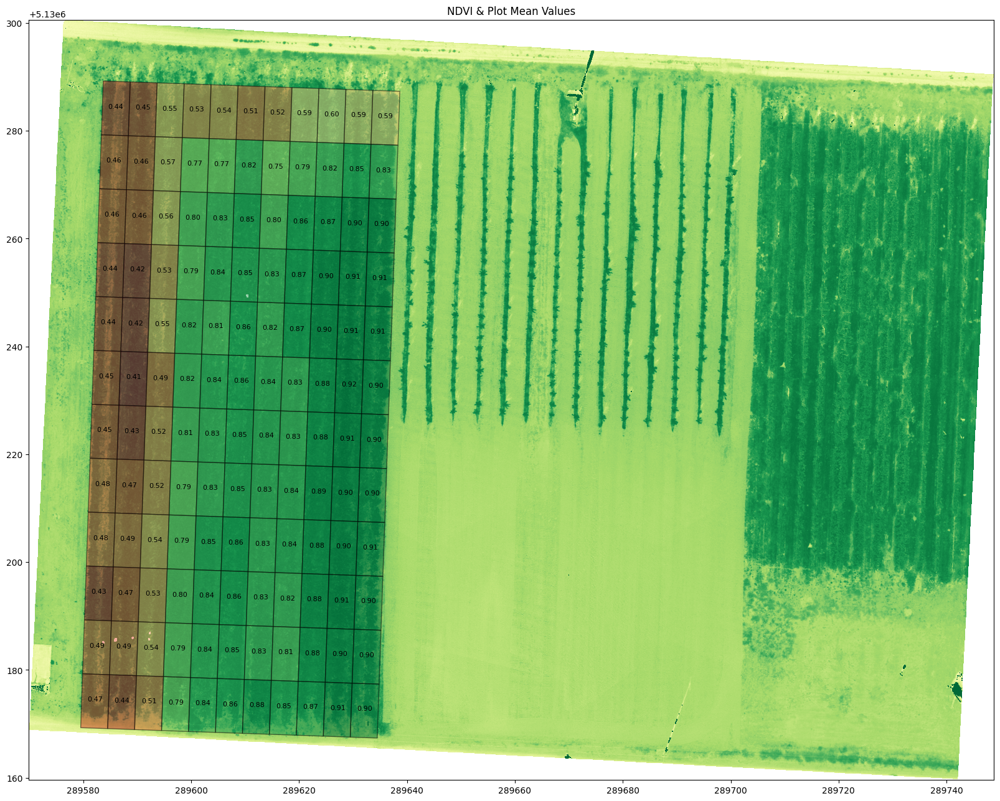

In [6]:
def plot_zonal_statistics(data, stats_df, title, cmap, stats_col, plot_extent, vmin=-1, vmax=1):
    """
    Plot raster data with an overlay of zonal statistics, with customizable colormap limits.

    Parameters:
    - data: Numpy array of the raster data. This is the base data to be visualized.
    - stats_df: Geopandas GeoDataFrame containing the zonal statistics. This includes statistics calculated for specific zones of interest.
    - title: Title for the plot. This provides context and description for the plot.
    - cmap: Colormap to use for the raster data. Defines the color mapping of the data values.
    - stats_col: Column name of the statistic to plot. This specifies which statistical measure to display (e.g., mean, max).
    - plot_extent: Plotting extent for the raster data. This defines the spatial boundaries of the plot.
    - vmin: Minimum value for colormap scaling. This ensures consistent color representation across different plots.
    - vmax: Maximum value for colormap scaling. Similar to vmin, it sets the upper limit of the color scale.

    Description:
    This function creates a plot of the raster data with an overlay of zonal statistics. The zonal statistics are visualized using the specified colormap, and statistics are annotated on the plot for clarity. The colormap limits (vmin and vmax) can be adjusted to control the color representation of the raster data.
    """
    # Create a figure and axis for plotting with a specified size
    fig, ax = plt.subplots(figsize=(20, 20))
    
    # Display the raster data with the chosen colormap and scaling
    ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax, extent=plot_extent)
    
    # Set the title of the plot
    ax.set_title(title)
    
    # Overlay the zonal statistics on the raster data
    stats_df.plot(stats_col, ax=ax, cmap=cmap, edgecolor='black', linewidth=1, alpha=0.5)
    
    # Annotate the zonal statistics on the plot
    for _, row in stats_df.iterrows():
        if stats_col in row and row.geometry.centroid is not None:
            # Annotate with the statistic value at the centroid of each zone
            ax.annotate(text='{:.2f}'.format(row[stats_col]), 
                        xy=row.geometry.centroid.coords[0], 
                        ha='center', fontsize=8)
    
    # Display the plot
    plt.show()

# Compute NDVI zonal statistics
ndvi_stats = compute_zonal_stats(plots_aoi, ndvi_index, dem_transform, "count min mean max median std")

# Convert the computed statistics to a GeoDataFrame
ndvi_df = gpd.GeoDataFrame.from_features(ndvi_stats)

# Save the zonal statistics to a CSV file for further analysis or record-keeping
ndvi_df.to_csv('output/aoi1_plot_mean_ndvi.csv')

# Plot the NDVI zonal statistics with a defined color range to ensure consistent green coloration
plot_zonal_statistics(ndvi_index, ndvi_df, 
                      "NDVI & Plot Mean Values", 
                      'RdYlGn', 
                      'mean', 
                      plotting_extent(dem_data[0], dem_transform), 
                      vmin=-1, 
                      vmax=1)


### Zonal Statistics Calculation and Visualization for Canopy Mean Height

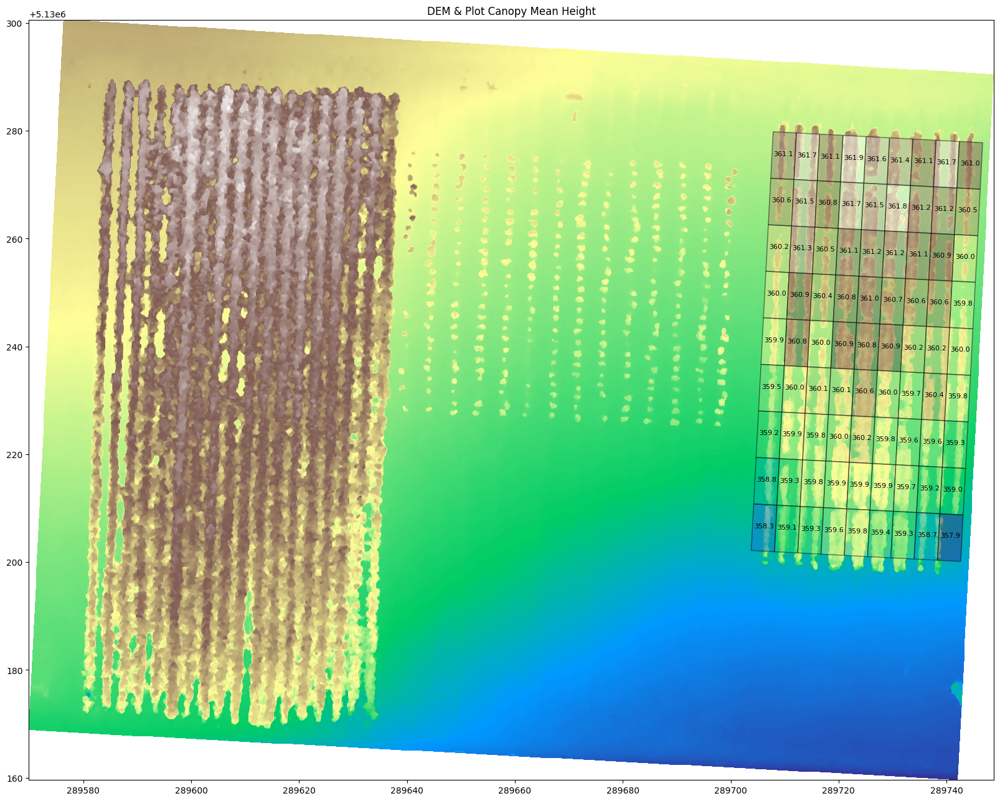

In [7]:
# Define plotting extent for visualizing the raster data
# This function computes the extent (bounding box) for the raster data to be used in plotting
plot_extent = plotting_extent(elevation_data, dem_transform)

# Load the Area of Interest (AOI) shapefile for Plot 2
# This shapefile contains polygons that define the areas for which we want to compute statistics
plots_2 = gpd.read_file('data/plots_2.shp')

# Compute zonal statistics for the AOI
# The zonal statistics function calculates statistics for the raster data (elevation_data)
# within each polygon defined in the AOI shapefile (plots_2)
# Parameters:
# - plots_2: GeoDataFrame containing the polygons for each plot
# - elevation_data: Numpy array of raster elevation data
# - nodata=0: Value to treat as nodata (ignored in statistics)
# - affine=dem_transform: Affine transformation to map raster coordinates to geographic coordinates
# - geojson_out=True: Output statistics in GeoJSON format
# - copy_properties=True: Include properties from the input GeoDataFrame in the output
# - stats: List of statistics to compute (count, min, mean, max, median, std)
plot_zs = rs.zonal_stats(plots_2, elevation_data, nodata=0, affine=dem_transform, geojson_out=True, 
                         copy_properties=True, stats="count min mean max median std")

# Convert the zonal statistics output to a GeoDataFrame
# This allows easy manipulation and plotting of the statistics data
plot_df = gpd.GeoDataFrame.from_features(plot_zs)

# Save the zonal statistics to a CSV file
# This file contains the computed statistics for each plot in the AOI
plot_df.to_csv('output/aoi2_plot_mean_height.csv')

# Create a figure with a single subplot for visualizing the elevation data and zonal statistics
fig, ax = plt.subplots(figsize=(20, 20))

# Plot the elevation data
# The imshow function displays the raster data as an image
# Parameters:
# - elevation_data: The data to plot
# - cmap='terrain': Colormap to use for displaying the elevation data
# - extent=plot_extent: The extent of the raster data for accurate geographic representation
# - vmin and vmax: Minimum and maximum values for color scaling
ax.imshow(elevation_data, cmap='terrain', extent=plot_extent, vmin=np.nanmin(elevation_data), vmax=np.nanmax(elevation_data))

# Plot the mean values of the zonal statistics on top of the elevation data
# This function overlays the mean values from the zonal statistics on the elevation data
plot_df.plot('mean', ax=ax, cmap='terrain', edgecolor='black', linewidth=1, alpha=0.5)

# Annotate the mean values on the plot
# Loop through each row of the GeoDataFrame and add text annotations at the centroid of each plot
for idx, row in plot_df.iterrows():
    if 'mean' in row and row.geometry.centroid is not None:
        # Annotate with the mean value, formatted to one decimal place
        ax.annotate(text='{0:0.1f}'.format(row['mean']), xy=row.geometry.centroid.coords[0], ha='center', fontsize=8)

# Set the title for the plot
plt.title("DEM & Plot Canopy Mean Height")

# Display the plot
plt.show()


### Thermal Data Computation and Visualization

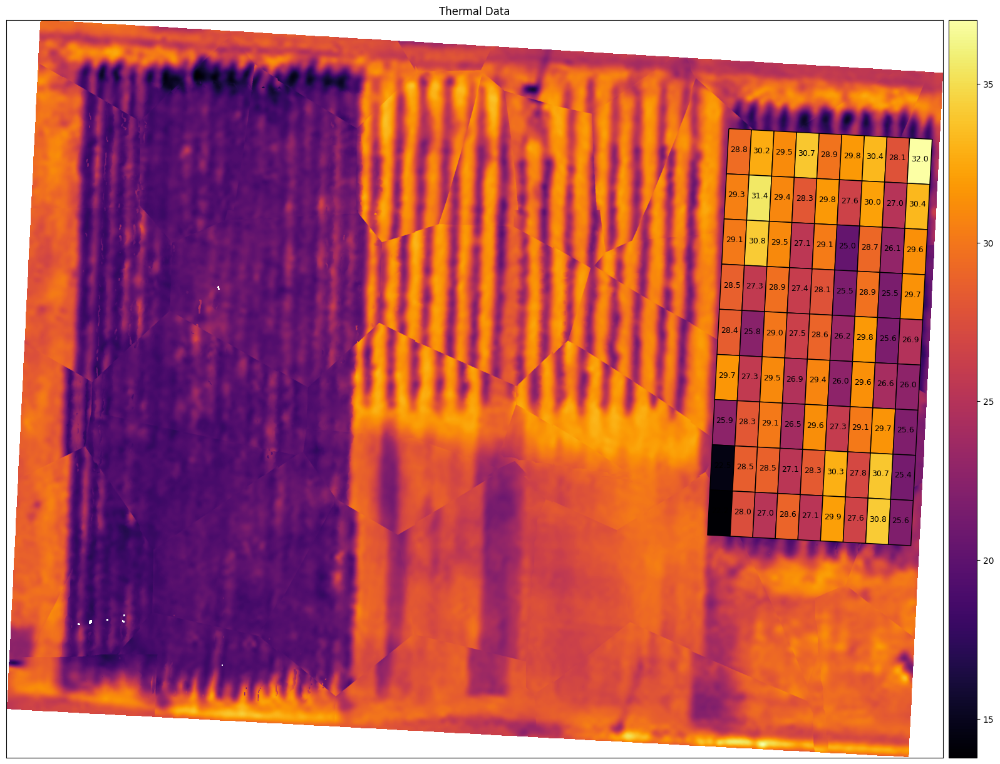

In [8]:
def calculate_thermal_data(ortho_data):
    """
    Convert thermal data to Celsius and mask non-positive values.

    Parameters:
    - ortho_data: Numpy array of the orthomosaic data, which includes a thermal band (assumed to be band index 5).

    Returns:
    - Thermal data as a masked array in Celsius.
    """
    # Mask out non-positive values in the thermal data band
    # Band index 5 is assumed to contain thermal data
    # Values <= 0 are invalid or represent non-data areas, so they are masked
    thermal_data = np.ma.masked_where(ortho_data[5] <= 0, ortho_data[5])
    
    # Convert the thermal data from Kelvin to Celsius
    # Orthomosaic data is assumed to be in Kelvin and needs conversion to Celsius
    # The conversion formula is: (Kelvin / 100) - 273.15
    # Dividing by 100 accounts for the scaling factor in the data
    return (thermal_data / 100) - 273.15

# Compute thermal mean statistics
# First, calculate the thermal data in Celsius
thermal_data = calculate_thermal_data(ortho_data)

# Compute zonal statistics for the thermal data
# The zonal statistics function calculates statistics for the thermal data within each polygon in the AOI
# Parameters:
# - plots_2: GeoDataFrame containing the polygons for each plot
# - thermal_data: Numpy array of the converted thermal data in Celsius
# - dem_transform: Affine transformation to map raster coordinates to geographic coordinates
# - stats: List of statistics to compute (count, min, mean, max, median, std)
thermal_stats = compute_zonal_stats(plots_2, thermal_data, dem_transform, "count min mean max median std")

# Convert the zonal statistics output to a GeoDataFrame
# This allows for easy manipulation and plotting of the statistics data
thermal_df = gpd.GeoDataFrame.from_features(thermal_stats)

# Save the thermal statistics to a CSV file
# This file contains the computed statistics for each plot in the AOI
thermal_df.to_csv('output/aoi2_plot_mean_thermal.csv')

# Plot thermal mean statistics
# Create a figure with a single subplot for visualizing the thermal data and zonal statistics
fig, ax = plt.subplots(figsize=(20, 20))

# Plot the thermal data
# The plot_bands function displays the thermal data as an image
# Parameters:
# - thermal_data: The data to plot
# - scale=False: Do not scale the data values for plotting
# - cmap="inferno": Colormap to use for displaying the thermal data
# - title: Title for the plot
# - extent: The extent of the raster data for accurate geographic representation
ep.plot_bands(thermal_data, ax=ax, scale=False, cmap="inferno", title="Thermal Data", extent=plotting_extent(dem_data[0], dem_transform))

# Overlay the mean values from the zonal statistics on the thermal data plot
# Plot the mean values for each plot area
thermal_df.plot('mean', ax=ax, cmap='inferno', edgecolor='black', linewidth=1)

# Annotate the mean values on the plot
# Apply a lambda function to add text annotations at the centroid of each plot
# The text shows the mean thermal value, formatted to one decimal place
thermal_df.apply(lambda x: ax.annotate(text='{0:0.1f}'.format(x['mean']), xy=x.geometry.centroid.coords[0], ha='center', fontsize=9), axis=1)

# Display the plot
plt.show()


### Canopy Model Analysis and Volume Computation

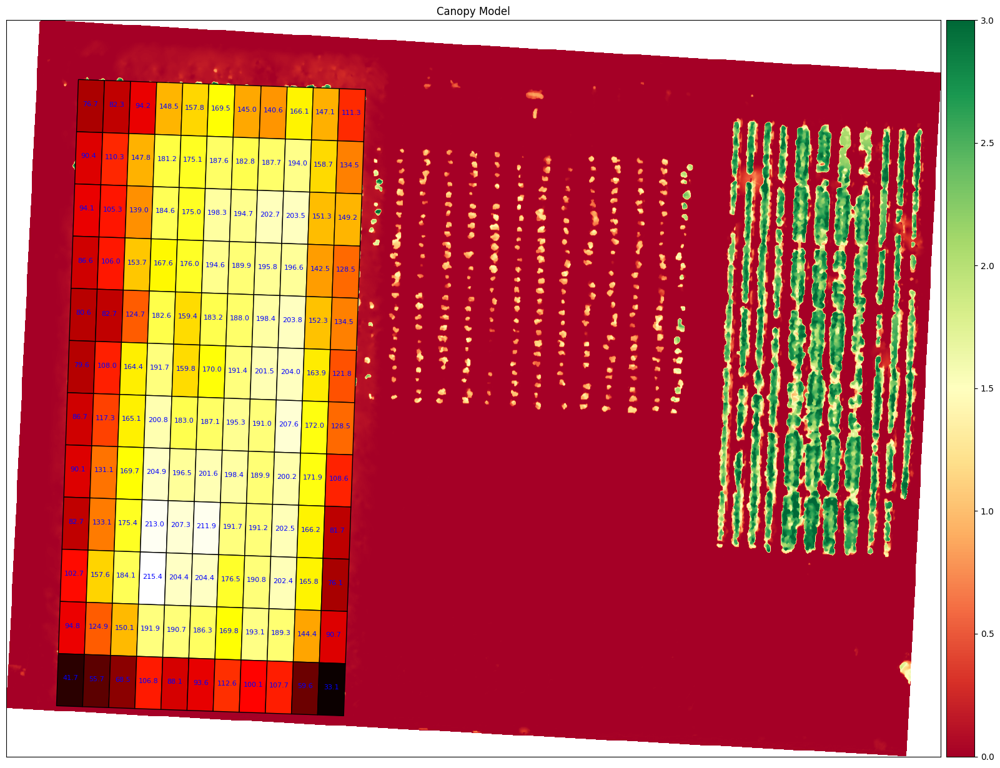

In [9]:
# Load the Area of Interest (AOI) polygons
# The shapefile contains polygons representing different plots within the study area
plots = gpd.read_file('data/plots_1.shp')

# Load the Digital Terrain Model (DTM) raster data
# DTM provides elevation data for the bare-earth surface
dtm = rasterio.open('data/dtm.tif')
dtm_arr = dtm.read()  # Read all bands of the DTM raster into a Numpy array

# Extract the first band from the DTM data
# Typically, the first band contains elevation values
elevation_dtm = dtm_arr[0]

# Mask non-positive elevation values in the DTM data
# Values <= 0 are considered invalid or non-data areas, so they are replaced with NaN
elevation_dtm[elevation_dtm <= 0] = np.nan

# Create a canopy model by subtracting the DTM from the elevation data
# The canopy model represents vegetation height above the bare-earth surface
canopy_model = (elevation_data - elevation_dtm)

# Compute zonal statistics for each plot
# Zonal statistics are calculated for the canopy model within each plot
# Parameters:
# - plots: GeoDataFrame containing the polygons for each plot
# - canopy_model: Numpy array of the canopy height model
# - nodata: Value representing no data (0 in this case)
# - affine: Affine transformation for the raster data
# - geojson_out: Return results in GeoJSON format
# - copy_properties: Include properties from the input shapefile
# - stats: List of statistics to compute (sum, count, min, mean, max)
plot_zs = rs.zonal_stats(plots, 
                         canopy_model, 
                         nodata=0, 
                         affine=dem_transform, 
                         geojson_out=True, 
                         copy_properties=True, 
                         stats="sum count min mean max")

# Extract pixel size from the DTM affine transformation
# The pixel size is needed to calculate area and volume
transform = dtm.transform
pixel_size_x = transform[0]  # Pixel size in the x-direction
pixel_size_y = -transform[4]  # Pixel size in the y-direction (negative because of coordinate system)

# Define a function to calculate volume from pixel count and pixel sum
# Volume is computed as the product of average pixel value and pixel area
# Parameters:
# - pixel_count: Number of pixels within each plot
# - pixel_sum: Sum of pixel values within each plot
def volume(pixel_count, pixel_sum):
    return (pixel_sum / pixel_count * (pixel_size_x * pixel_size_y) * pixel_count)

# Convert zonal statistics output to a GeoDataFrame
# This allows for easy manipulation and plotting of the statistics data
plot_df = gpd.GeoDataFrame.from_features(plot_zs)

# Add calculated volume and area columns to the DataFrame
# Volume in cubic meters is computed using the previously defined function
# Area in square meters is directly computed from the geometry
plot_df['volume_m3'] = plot_df.apply(lambda x: volume(x['count'], x['sum']), axis=1)
plot_df['area_m2'] = plot_df.apply(lambda x: x.geometry.area, axis=1)

# Save the DataFrame with volume and area information to a CSV file
# This file contains the computed statistics for each plot in the AOI
plot_df.to_csv('output/aoi1_plot_volume.csv')

# Create a figure with a single subplot to visualize the canopy model and volume
fig, ax = plt.subplots(figsize=(20, 20))

# Plot the canopy model
# The plot_bands function displays the canopy model as an image
# Parameters:
# - canopy_model: The data to plot
# - scale=False: Do not scale the data values for plotting
# - cmap="RdYlGn": Colormap to use for displaying the canopy model
# - title: Title for the plot
# - extent: The extent of the raster data for accurate geographic representation
# - vmin, vmax: Value range for colormap scaling
ep.plot_bands(canopy_model, 
              ax=ax, 
              scale=False, 
              cmap="RdYlGn", 
              title="Canopy Model", 
              extent=plot_extent,
              vmin=0,
              vmax=3)

# Overlay the volume data on the canopy model plot
# Plot the volume in cubic meters for each plot
# Parameters:
# - plot_df: DataFrame containing the volume data
# - cmap='hot': Colormap for displaying volume
# - edgecolor='black': Edge color for plot boundaries
# - linewidth=1: Width of the plot boundaries
plot_df.plot('volume_m3',
             ax=ax, 
             cmap='hot', 
             edgecolor='black',
             linewidth=1
            )

# Annotate the plot with volume values
# Add text annotations at the centroid of each plot with the volume value
# The text shows the volume in cubic meters, formatted to one decimal place
plot_df.apply(lambda x: ax.annotate(text='{0:0.1f}'.format(x['volume_m3']), xy=x.geometry.centroid.coords[0], ha='center', fontsize=8, color='blue'), axis=1)

# Display the plot
plt.show()


################################################################################